- Timestamps are not unique!
- Порядок аудио!
- we need to know for sure The sampling frequency of "eda_signal" (in Hz, i.e., samples/second).

In [1]:
import pandas as pd
import numpy as np

In [2]:
Sample_rate = 200

In [3]:
data = pd.read_csv('/Users/annapalatkina/Desktop/drive/driving_performance_project/data/SimData_W1D9N0B8.csv', comment='#')
data.head()

/var/folders/f1/w7d0x47j0qq9jn7k7vhjrkzh0000gn/T/ipykernel_23754/1398436676.py:1: DtypeWarning: Columns (3,4,6,15,16,17) have mixed types. Specify dtype option on import or set low_memory=False.
  data = pd.read_csv('/Users/annapalatkina/Desktop/drive/driving_performance_project/data/SimData_W1D9N0B8.csv', comment='#')


,Row,Timestamp,EventSource,SlideEvent,StimType,Duration,CollectionPhase,SourceStimuliName,EventSource.1,SampleNumber,...,Saccade Index,Saccade Index by Stimulus,Saccade Start,Saccade End,Saccade Duration,Saccade Amplitude,Saccade Peak Velocity,Saccade Peak Acceleration,Saccade Peak Deceleration,Saccade Direction
0,1,4.0017,1.0,StartSlide,TestImage,3000000.0,StimuliDisplay,Neon Glasses,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2,4.0018,NaN,NaN,NaN,NaN,NaN,Neon Glasses,1.0,64640.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,3,9.0018,NaN,NaN,NaN,NaN,NaN,Neon Glasses,1.0,64641.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,4,9.0882,NaN,NaN,NaN,NaN,NaN,Neon Glasses,NaN,NaN,...,1.0,NaN,2.04485,98.72455,96.6797,13.896257,167275.149559,6.688418e+10,-1.044654e+11,9.648045
4,5,14.0018,NaN,NaN,NaN,NaN,NaN,Neon Glasses,1.0,64642.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [4]:
len(data)

410524

In [5]:
data.columns

Index(['Row', 'Timestamp', 'EventSource', 'SlideEvent', 'StimType', 'Duration',
       'CollectionPhase', 'SourceStimuliName', 'EventSource.1', 'SampleNumber',
       'Channel 13 (Raw)', 'EventSource.2', 'SampleNumber.1',
       'Channel 9 (Raw)', 'EventSource.3', 'MarkerName', 'MarkerDescription',
       'MarkerType', 'SceneType', 'EventSource.4', 'DistanceToNextSpeedSign',
       'DistanceToNextOverheadSign', 'VelocityX', 'DistanceToTargetPosition',
       'DistanceToTargetSpeed', 'CarSpeed', 'EventSource.5', 'CPU Sys',
       'Memory Sys', 'CPU Proc', 'Memory Proc', 'EventSource.6',
       'ET_GazeLeftx', 'ET_GazeLefty', 'ET_GazeRightx', 'ET_GazeRighty',
       'ET_PupilLeft', 'ET_PupilRight', 'ET_TimeSignal', 'ET_DistanceLeft',
       'ET_DistanceRight', 'ET_CameraLeftX', 'ET_CameraLeftY',
       'ET_CameraRightX', 'ET_CameraRightY', 'EventSource.7', 'Gaze X',
       'Gaze Y', 'Interpolated Gaze X', 'Interpolated Gaze Y',
       'Interpolated Distance', 'Gaze Velocity', 'Gaze Accel

In [6]:
data = data[['Row', 'Timestamp', 'Channel 9 (Raw)', 'Channel 13 (Raw)','MarkerName','MarkerType']]

In [7]:
data[data['MarkerName'].notna()].sort_values('Row')

,Row,Timestamp,Channel 9 (Raw),Channel 13 (Raw),MarkerName,MarkerType
37210,37211,90065.0297,NaN,NaN,Experiment,S
109554,109555,270251.2782,NaN,NaN,IntenseAudio,S
251056,251057,624539.5499,NaN,NaN,InterimAudio,S
251057,251058,624539.5499,NaN,NaN,IntenseAudio,E
270936,270937,674413.2895,NaN,NaN,CalmAudio,S
270937,270938,674413.2895,NaN,NaN,InterimAudio,E
386225,386226,973073.9851,NaN,NaN,CalmAudio,E
392512,392513,990035.7362,NaN,NaN,Experiment,E


In [8]:
experiment_start = data[(data.MarkerName == "Experiment") & (data.MarkerType == "S")].Row.iloc[0]
experiment_end = data[(data.MarkerName == "Experiment") & (data.MarkerType == "E")].Row.iloc[0]

calm_start = data[(data.MarkerName == "CalmAudio") & (data.MarkerType == "S")].Row.iloc[0]
calm_end = data[(data.MarkerName == "CalmAudio") & (data.MarkerType == "E")] .Row.iloc[0]
calm_data = data[int(calm_start):int(calm_end)]

interim_start = data[(data.MarkerName == "InterimAudio") & (data.MarkerType == "S")].Row.iloc[0]
interim_end = data[(data.MarkerName == "InterimAudio") & (data.MarkerType == "E")] .Row.iloc[0]
interim_data = data[int(interim_start):int(interim_end)]

intense_start = data[(data.MarkerName == "IntenseAudio") & (data.MarkerType == "S")].Row.iloc[0]
intense_end = data[(data.MarkerName == "IntenseAudio") & (data.MarkerType == "E")] .Row.iloc[0]
intense_data = data[int(intense_start):int(intense_end)]

first_silence = data[int(experiment_start):int(calm_start)] # Only if calm audio first
last_silence = data[int(intense_end):int(experiment_end)] # Only if calm audio first

# Analyze Electrodermal Activity

In [9]:
# Load the NeuroKit package and other useful packages
import neurokit2 as nk
import matplotlib.pyplot as plt
%matplotlib inline

In [10]:
plt.rcParams['figure.figsize'] = [35, 5]  # Bigger images

In [11]:
eda_calm = np.array(calm_data['Channel 9 (Raw)'].dropna())
eda_calm.shape

(59732,)

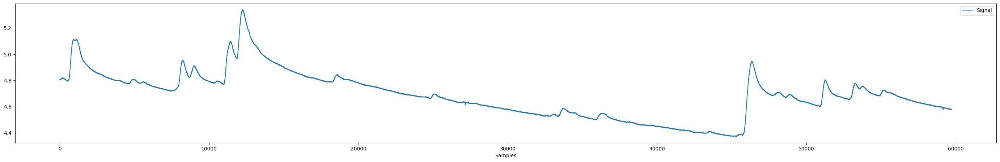

In [12]:
nk.signal_plot(eda_calm)

In [13]:
eda_intense = np.array(intense_data['Channel 9 (Raw)'].dropna())
eda_intense.shape

(70858,)

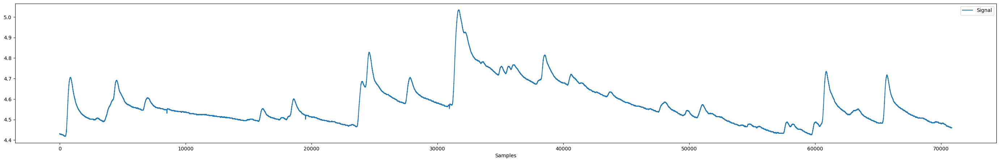

In [14]:
nk.signal_plot(eda_intense)

In [15]:
# Process the raw EDA signal
signals_calm, info_calm = nk.eda_process(eda_calm, sampling_rate=Sample_rate)
signals_intense, info_intense = nk.eda_process(eda_intense, sampling_rate=Sample_rate)

In [16]:
signals_calm

,EDA_Raw,EDA_Clean,EDA_Tonic,EDA_Phasic,SCR_Onsets,SCR_Peaks,SCR_Height,SCR_Amplitude,SCR_RiseTime,SCR_Recovery,SCR_RecoveryTime
0,4.803162,4.803051,4.852369,-0.049318,0,0,0.0,0.0,0.0,0,0.0
1,4.803467,4.803056,4.852453,-0.049397,0,0,0.0,0.0,0.0,0,0.0
2,4.803772,4.803063,4.852537,-0.049474,0,0,0.0,0.0,0.0,0,0.0
3,4.803162,4.803072,4.852621,-0.049549,0,0,0.0,0.0,0.0,0,0.0
4,4.802856,4.803083,4.852706,-0.049622,0,0,0.0,0.0,0.0,0,0.0
...,...,...,...,...,...,...,...,...,...,...,...
59727,4.577637,4.578091,4.597687,-0.000253,0,0,0.0,0.0,0.0,0,0.0
59728,4.578552,4.578091,4.597687,-0.000233,0,0,0.0,0.0,0.0,0,0.0
59729,4.578552,4.578090,4.597687,-0.000214,0,0,0.0,0.0,0.0,0,0.0
59730,4.577942,4.578090,4.597687,-0.000194,0,0,0.0,0.0,0.0,0,0.0


In [17]:
nk.eda_plot(signals_calm, info_calm, False)

In [18]:
nk.eda_plot(signals_intense, info_intense, False)

## Locate Skin Conductance Response (SCR) features

In [19]:
# Extract clean EDA and SCR features
cleaned_calm = signals_calm["EDA_Clean"]
features_calm = [info_calm["SCR_Onsets"], info_calm["SCR_Peaks"], info_calm["SCR_Recovery"]]

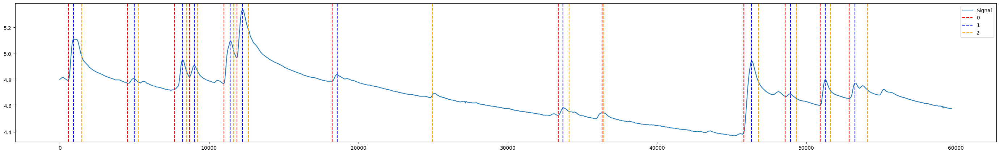

In [20]:
# We can now visualize the location of the peak onsets, the peak amplitude, as well as the half-recovery time points in the cleaned EDA signal, respectively marked by the red dashed line, blue dashed line, and orange dashed line.
plt.rcParams['figure.figsize'] = [35, 5]  # Bigger images
plot = nk.events_plot(features_calm, cleaned_calm, color=['red', 'blue', 'orange'])

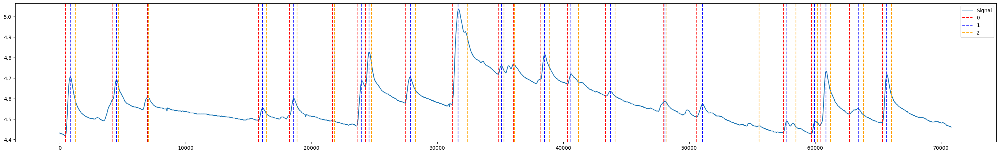

In [21]:
cleaned_intense= signals_intense["EDA_Clean"]
features_intense = [info_intense["SCR_Onsets"], info_intense["SCR_Peaks"], info_intense["SCR_Recovery"]]
plot = nk.events_plot(features_intense, cleaned_intense, color=['red', 'blue', 'orange'])

## Decompose EDA into Phasic and Tonic components

<Axes: >

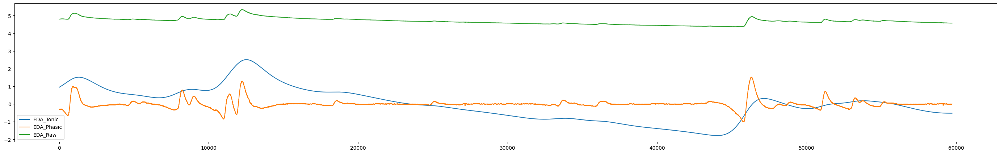

In [22]:
# Filter phasic and tonic components
d_calm = nk.eda_phasic(nk.standardize(eda_calm), sampling_rate=Sample_rate)
d_calm["EDA_Raw"] = eda_calm  # Add raw signal
d_calm.plot()

<Axes: >

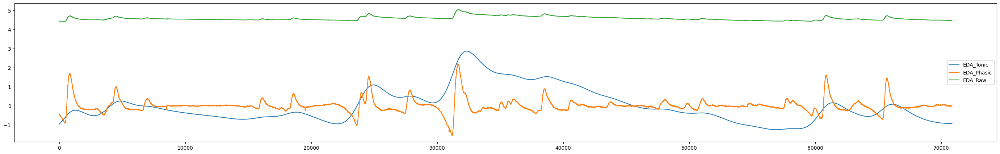

In [23]:
d_intense = nk.eda_phasic(nk.standardize(eda_intense), sampling_rate=Sample_rate)
d_intense["EDA_Raw"] = eda_intense  # Add raw signal
d_intense.plot()

# Cardiac activity (ECG) analysis

In [24]:
ecg_calm = np.array(calm_data['Channel 13 (Raw)'].dropna())
ecg_calm.shape

(59732,)

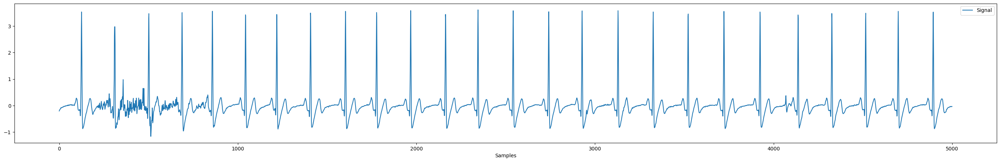

In [25]:
nk.signal_plot(ecg_calm[:5000])

In [26]:
ecg_intense = np.array(intense_data['Channel 13 (Raw)'].dropna())
ecg_intense.shape

(70858,)

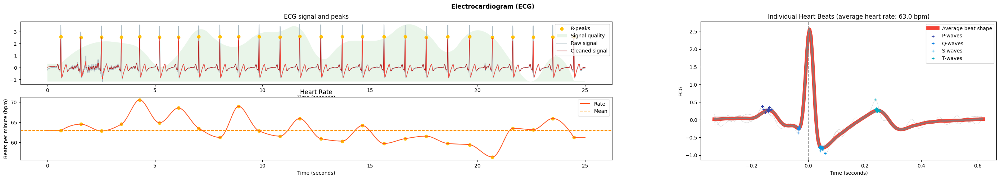

In [27]:
# Process it
ecg_signals_calm, ecg_info_calm = nk.ecg_process(ecg_calm[:5000], sampling_rate=Sample_rate)

# Visualise the processing
nk.ecg_plot(ecg_signals_calm, ecg_info_calm)

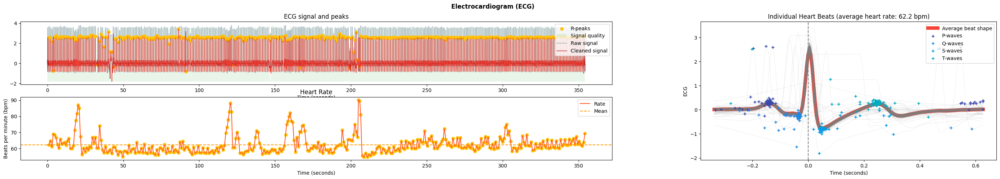

In [28]:
# Process it
ecg_signals_intense, ecg_info_intense = nk.ecg_process(ecg_intense, sampling_rate=Sample_rate)

# Visualise the processing
nk.ecg_plot(ecg_signals_intense, ecg_info_intense)

,HRV_MeanNN,HRV_SDNN,HRV_SDANN1,HRV_SDNNI1,HRV_SDANN2,HRV_SDNNI2,HRV_SDANN5,HRV_SDNNI5,HRV_RMSSD,HRV_SDSD,...,HRV_SampEn,HRV_ShanEn,HRV_FuzzyEn,HRV_MSEn,HRV_CMSEn,HRV_RCMSEn,HRV_CD,HRV_HFD,HRV_KFD,HRV_LZC
0,973.235294,62.481395,17.909923,58.985062,NaN,NaN,NaN,NaN,58.987356,59.083711,...,1.661545,5.419292,1.225955,1.305088,1.286394,1.90673,1.842793,1.873209,4.691873,0.944472


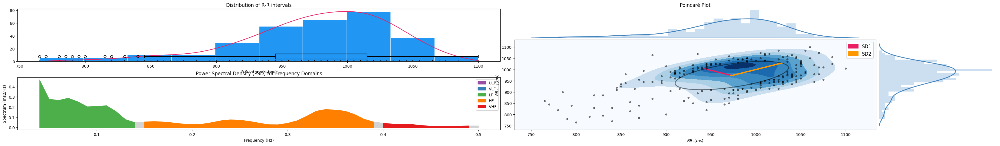

In [29]:
# Find peaks
peaks, info = nk.ecg_peaks(ecg_calm, sampling_rate=Sample_rate)

# Compute HRV indices
nk.hrv(peaks, sampling_rate=Sample_rate, show=True)

,HRV_MeanNN,HRV_SDNN,HRV_SDANN1,HRV_SDNNI1,HRV_SDANN2,HRV_SDNNI2,HRV_SDANN5,HRV_SDNNI5,HRV_RMSSD,HRV_SDSD,...,HRV_SampEn,HRV_ShanEn,HRV_FuzzyEn,HRV_MSEn,HRV_CMSEn,HRV_RCMSEn,HRV_CD,HRV_HFD,HRV_KFD,HRV_LZC
0,956.490515,98.83534,13.414706,91.595822,7.104402,91.803617,NaN,NaN,97.958093,98.091325,...,1.398867,5.646287,0.964001,1.13502,1.281674,1.724437,1.554634,1.814939,2.901197,0.924388


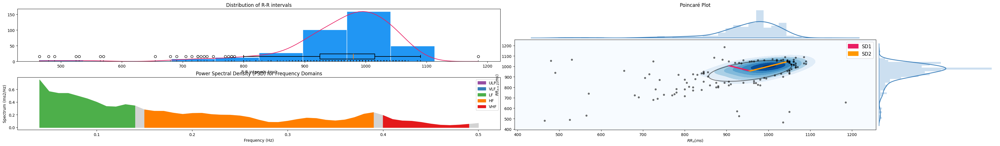

In [30]:
# Find peaks
peaks, info = nk.ecg_peaks(ecg_intense, sampling_rate=Sample_rate)

# Compute HRV indices
nk.hrv(peaks, sampling_rate=Sample_rate, show=True)

Distribution of R-R Intervals:





Both conditions show a unimodal distribution with a peak at 800-1000 ms, reflecting the average heart rate.



Condition 2 has a broader and more pronounced peak, indicating greater variability or a shift in heart rate dynamics compared to Condition 1.



Poincare Plots:





The Poincare plots display the relationship between successive R-R intervals (RR(n) vs. RR(n+1)).



Both show an elliptical shape, typical of healthy heart rate variability (HRV), with SD1 and SD2 representing short-term and long-term variability.



Condition 2 has a larger and more dispersed ellipse, suggesting increased HRV, possibly reflecting a change in autonomic nervous system activity.



Power Spectral Density (PSD):





The PSD plots show frequency domain analysis of R-R intervals.



Both conditions have dominant power in the low-frequency (LF) range (0.04-0.15 Hz).



Condition 2 exhibits a more pronounced LF peak and broader distribution, indicating enhanced sympathetic or parasympathetic influence.



Statistical Metrics:





HRV metrics (e.g., HRV_Mean, HRV_SDNN, HRV_SampEn) show minor differences (e.g., HRV_SampEn: 0.60791 vs. 0.60419), suggesting subtle changes in signal complexity or regularity.



## Extraction of ECG Features

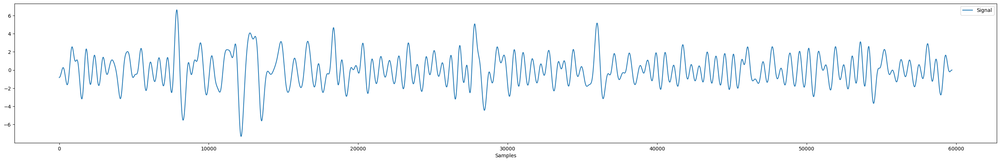

In [32]:
# Extract peaks
rpeaks, info = nk.ecg_peaks(ecg_calm, sampling_rate=Sample_rate)

# Compute rate
ecg_rate = nk.ecg_rate(rpeaks, sampling_rate=Sample_rate, desired_length=len(ecg_calm))

edr = nk.ecg_rsp(ecg_rate, sampling_rate=Sample_rate)

# Visual comparison
nk.signal_plot(edr)

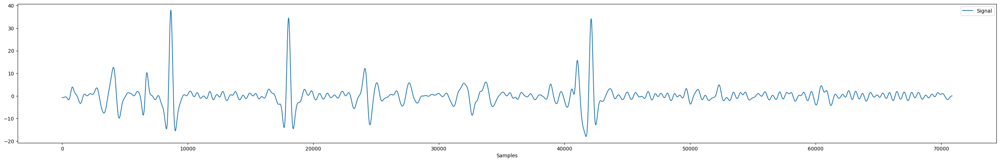

In [33]:
# Extract peaks
rpeaks, info = nk.ecg_peaks(ecg_intense, sampling_rate=Sample_rate)

# Compute rate
ecg_rate = nk.ecg_rate(rpeaks, sampling_rate=Sample_rate, desired_length=len(ecg_intense))

edr = nk.ecg_rsp(ecg_rate, sampling_rate=Sample_rate)

# Visual comparison
nk.signal_plot(edr)